In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [ ]:
cd "/content/drive/MyDrive/Egyptain Currency Dataset"

/content/drive/MyDrive/Egyptain Currency Dataset


In [ ]:
# !pip install split-folders

In [ ]:
# import splitfolders

# # Specify input folder containing your images and output folder to store the split data
# input_folder = "/content/drive/MyDrive/Egyptain Currency Dataset"
# output_folder = "/content/drive/MyDrive/Output of Egyptain Currency"

# # Split the data into train, validation and test sets with ratios 0.8, 0.1 and 0.1 respectively
# splitfolders.ratio(input_folder, output=output_folder, seed=1337, ratio=(.8,0.1))


In [ ]:
train_dir = '/content/drive/MyDrive/Output of Egyptain Currency/train'
val_dir = '/content/drive/MyDrive/Output of Egyptain Currency/val'
test_dir = '/content/drive/MyDrive/Output of Egyptain Currency/test'


In [ ]:
from keras.preprocessing.image import ImageDataGenerator

# define image width and height
img_width, img_height = 150, 150

# create data generator
datagen = ImageDataGenerator(rescale=1./255, zoom_range=0.3, rotation_range=50,
                             width_shift_range=0.2, height_shift_range=0.2, shear_range=0.2,
                             horizontal_flip=True, fill_mode='nearest')

# load and iterate training dataset
train_it = datagen.flow_from_directory('/content/drive/MyDrive/Output of Egyptain Currency/train', class_mode='categorical', target_size=(img_width, img_height))
# load and iterate validation dataset
val_it = datagen.flow_from_directory('/content/drive/MyDrive/Output of Egyptain Currency/val', class_mode='categorical', target_size=(img_width, img_height))



Found 559 images belonging to 7 classes.
Found 69 images belonging to 7 classes.


In [ ]:
generator = datagen.flow_from_directory(
    train_dir,
    target_size=(200, 200),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)


Found 559 images belonging to 7 classes.


In [ ]:
for class_name, class_index in generator.class_indices.items():
    print("Class Name:", class_name, " - Index:", class_index)


Class Name: 1  - Index: 0
Class Name: 10  - Index: 1
Class Name: 100  - Index: 2
Class Name: 20  - Index: 3
Class Name: 200  - Index: 4
Class Name: 5  - Index: 5
Class Name: 50  - Index: 6


In [ ]:
from tensorflow.keras.optimizers.legacy import Adam

In [ ]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense

# Create a sequential model
model = Sequential()

# Add the first convolutional layer
model.add(Conv2D(32, (3, 3), activation='relu', input_shape=(img_width, img_height, 3)))

# Add a max pooling layer
model.add(MaxPooling2D(pool_size=(2, 2)))

# Add the second convolutional layer
model.add(Conv2D(64, (3, 3), activation='relu'))

# Add a max pooling layer
model.add(MaxPooling2D(pool_size=(2, 2)))

# Add the third convolutional layer
model.add(Conv2D(128, (3, 3), activation='relu'))

# Add a max pooling layer
model.add(MaxPooling2D(pool_size=(2, 2)))

# Flatten the output
model.add(Flatten())

# Add a fully connected layer
model.add(Dense(256, activation='relu'))

# Add the output layer
model.add(Dense(7, activation='softmax'))

# Compile the model
model.compile(optimizer='adam', loss='categorical_crossentropy', metrics=['accuracy'])


In [ ]:
# calculate steps_per_epoch and validation_steps
steps_per_epoch = train_it.samples // train_it.batch_size
validation_steps = val_it.samples // val_it.batch_size

# fit the model
history = model.fit(train_it, steps_per_epoch=steps_per_epoch, epochs=100,
                    validation_data=val_it, validation_steps=validation_steps)


Epoch 1/100
17/17 [==============================] - 254s 14s/step - loss: 2.0912 - accuracy: 0.1499 - val_loss: 1.9355 - val_accuracy: 0.1562
Epoch 2/100
17/17 [==============================] - 11s 666ms/step - loss: 1.8337 - accuracy: 0.2220 - val_loss: 1.7449 - val_accuracy: 0.2969
Epoch 3/100
17/17 [==============================] - 10s 620ms/step - loss: 1.6216 - accuracy: 0.3510 - val_loss: 1.6354 - val_accuracy: 0.3594
Epoch 4/100
17/17 [==============================] - 11s 623ms/step - loss: 1.6114 - accuracy: 0.3662 - val_loss: 1.5627 - val_accuracy: 0.4219
Epoch 5/100
17/17 [==============================] - 11s 644ms/step - loss: 1.5245 - accuracy: 0.4175 - val_loss: 1.5488 - val_accuracy: 0.3438
Epoch 6/100
17/17 [==============================] - 9s 536ms/step - loss: 1.4549 - accuracy: 0.4421 - val_loss: 1.4601 - val_accuracy: 0.4062
Epoch 7/100
17/17 [==============================] - 11s 617ms/step - loss: 1.3590 - accuracy: 0.4668 - val_loss: 1.4722 - val_accuracy: 0

In [ ]:
# save the model
model.save('my_model.h5')


In [ ]:
from keras.models import load_model

# load the model
loaded_model = load_model('my_model.h5')

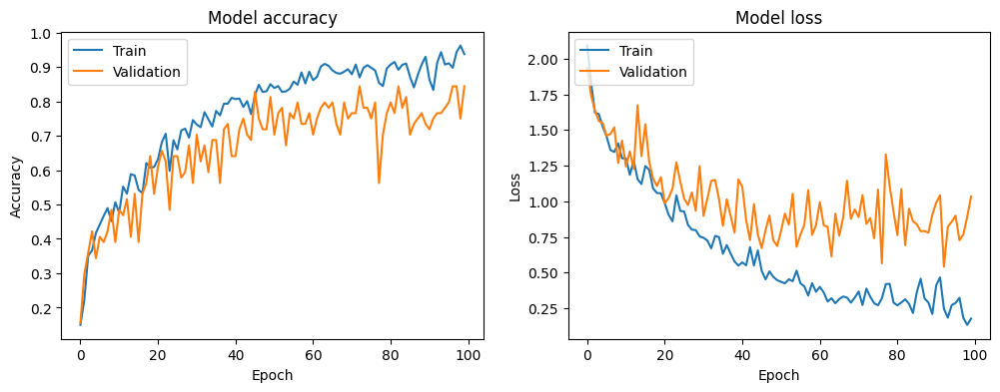

In [ ]:
import matplotlib.pyplot as plt

# Plot training & validation accuracy values
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'])
plt.plot(history.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')

# Plot training & validation loss values
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Validation'], loc='upper left')
plt.show()


In [ ]:
loaded_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 74, 74, 32)       0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 17, 17, 128)      0

In [ ]:
from keras.preprocessing.image import ImageDataGenerator
test_datagen = ImageDataGenerator(rescale=1./255)
test_generator = test_datagen.flow_from_directory(
    '/content/drive/MyDrive/Output of Egyptain Currency/test',
    target_size=(150, 150),
    batch_size=32,
    class_mode='categorical',
    shuffle=False
)
score = loaded_model.evaluate(test_generator)
print('Test loss:', score[0])
print('Test accuracy:', score[1])


Found 71 images belonging to 7 classes.
3/3 [==============================] - 17s 8s/step - loss: 0.8987 - accuracy: 0.8028
Test loss: 0.8987014293670654
Test accuracy: 0.8028169274330139


In [ ]:
cd '/content/drive/MyDrive/Output of Egyptain Currency/test/200/'

/content/drive/MyDrive/Output of Egyptain Currency/test/200


In [ ]:
from keras.models import load_model
import keras.utils as image
import matplotlib.pyplot as plt
import numpy as np
import os


In [ ]:
def load_image(img_path, show=False):
    img = image.load_img(img_path, target_size=(150, 150))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.

    if show:
        plt.imshow(img_tensor[0])
        plt.axis('off')
        plt.show()

    return img_tensor

In [ ]:
label_mapping = {0: 1, 1: 10, 2: 100, 3: 20, 4: 200, 5: 5, 6: 50}
reverse_mapping = {v: k for k, v in label_mapping.items()}


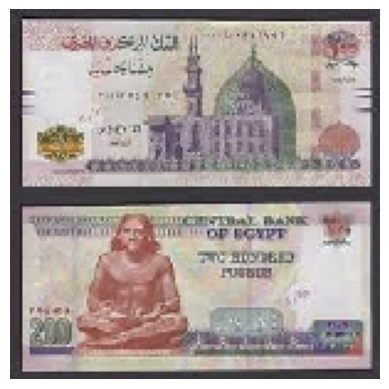

1/1 [==============================] - 0s 210ms/step
Predicted class: 200


In [ ]:
# load a single image
new_image = load_image("200.45.jpg", show=True)

# check prediction
pred = loaded_model.predict(new_image)
predicted_class = label_mapping[np.argmax(pred)]
print("Predicted class:", predicted_class)


Testing images in directory:  20
1/1 [==============================] - 0s 22ms/step
Image:  20.55.jpg
Predicted class:  20
Actual class:  20


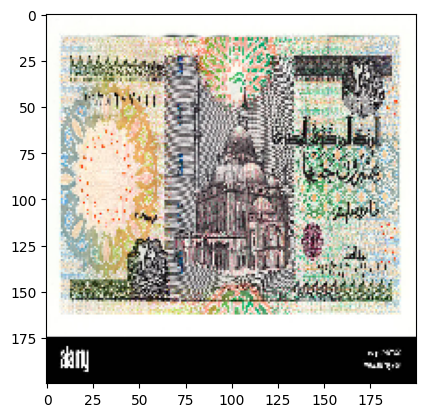

1/1 [==============================] - 0s 42ms/step
Image:  20.85.jpg
Predicted class:  20
Actual class:  20


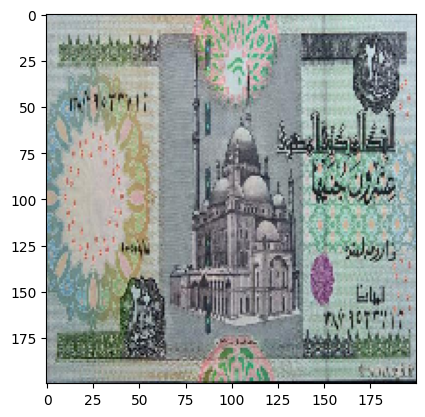

1/1 [==============================] - 0s 32ms/step
Image:  20.89.jpg
Predicted class:  50
Actual class:  20


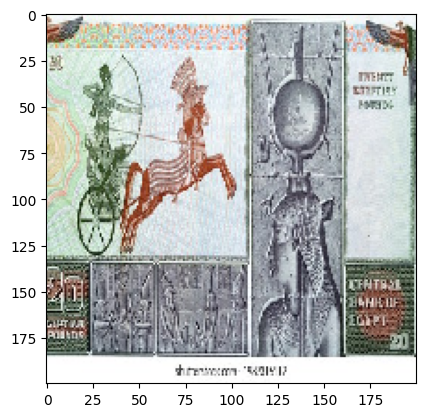

1/1 [==============================] - 0s 22ms/step
Image:  20.32.jpg
Predicted class:  20
Actual class:  20


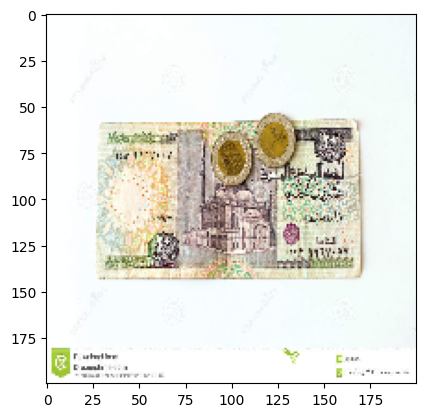

1/1 [==============================] - 0s 23ms/step
Image:  20.20.jpg
Predicted class:  20
Actual class:  20


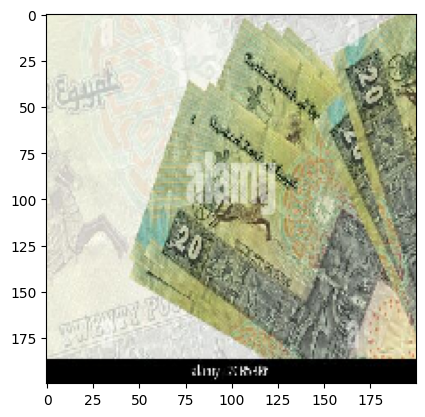

1/1 [==============================] - 0s 34ms/step
Image:  20.96.jpg
Predicted class:  20
Actual class:  20


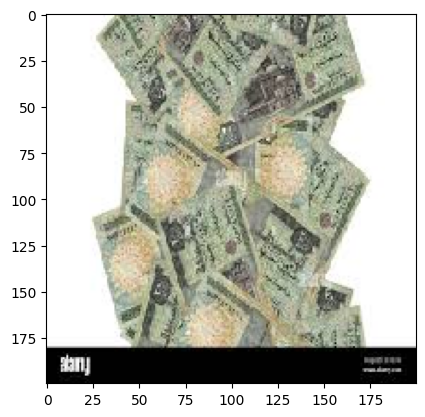

1/1 [==============================] - 0s 33ms/step
Image:  20.58.jpg
Predicted class:  20
Actual class:  20


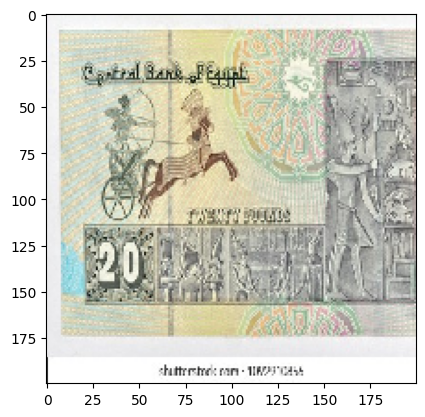

1/1 [==============================] - 0s 31ms/step
Image:  20.54.jpg
Predicted class:  20
Actual class:  20


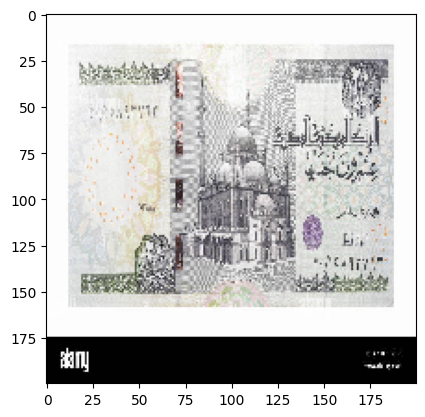

1/1 [==============================] - 0s 33ms/step
Image:  20.44.jpg
Predicted class:  20
Actual class:  20


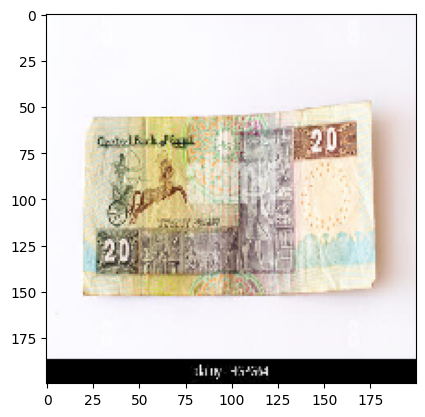

1/1 [==============================] - 0s 26ms/step
Image:  20.82.jpg
Predicted class:  20
Actual class:  20


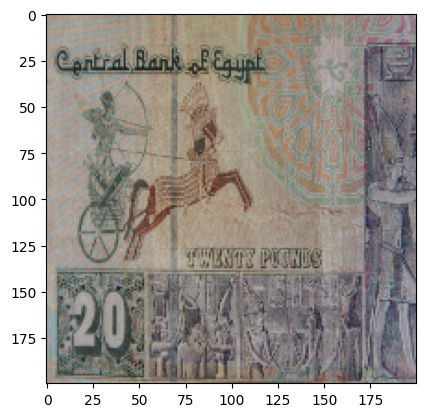

Testing images in directory:  10
1/1 [==============================] - 0s 26ms/step
Image:  10.20.jpg
Predicted class:  50
Actual class:  10


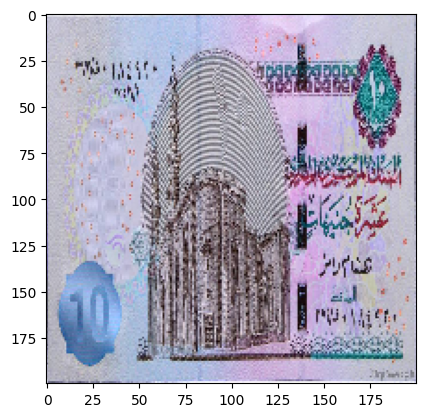

1/1 [==============================] - 0s 29ms/step
Image:  10.58.jpg
Predicted class:  100
Actual class:  10


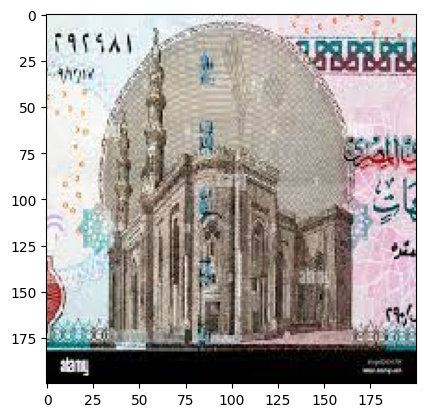

1/1 [==============================] - 0s 31ms/step
Image:  10.96.jpg
Predicted class:  10
Actual class:  10


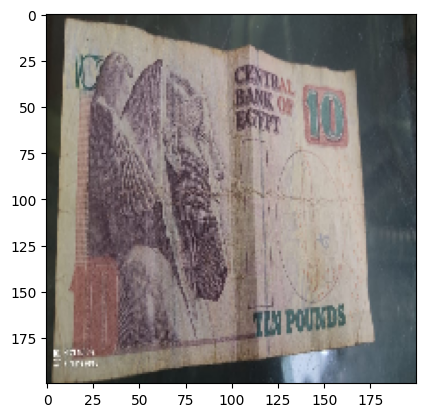

1/1 [==============================] - 0s 30ms/step
Image:  10.85.jpg
Predicted class:  10
Actual class:  10


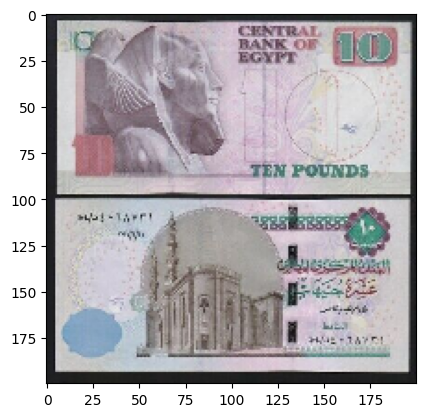

1/1 [==============================] - 0s 30ms/step
Image:  10.32.jpg
Predicted class:  10
Actual class:  10


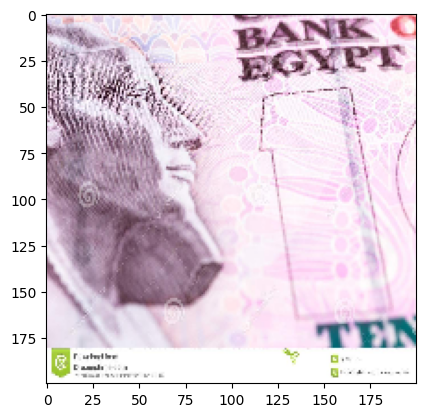

1/1 [==============================] - 0s 20ms/step
Image:  10.54.jpg
Predicted class:  50
Actual class:  10


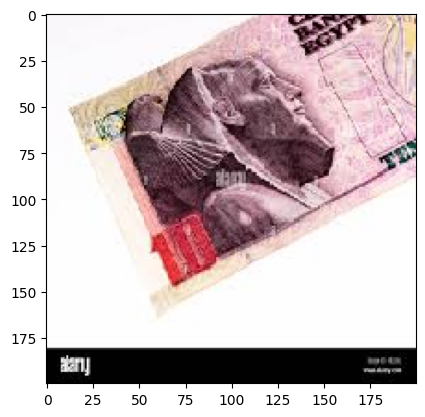

1/1 [==============================] - 0s 28ms/step
Image:  10.82.jpg
Predicted class:  10
Actual class:  10


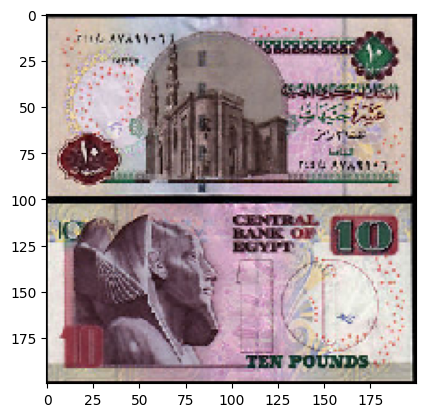

1/1 [==============================] - 0s 35ms/step
Image:  10.44.jpg
Predicted class:  10
Actual class:  10


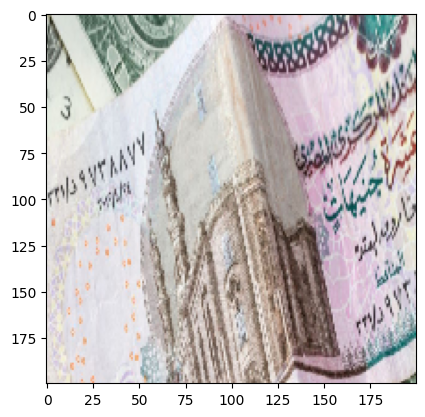

1/1 [==============================] - 0s 29ms/step
Image:  10.89.jpg
Predicted class:  50
Actual class:  10


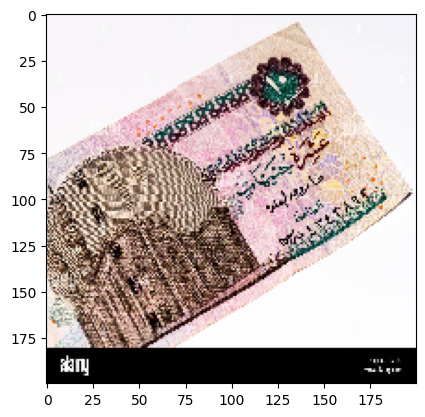

1/1 [==============================] - 0s 30ms/step
Image:  10.55.jpg
Predicted class:  10
Actual class:  10


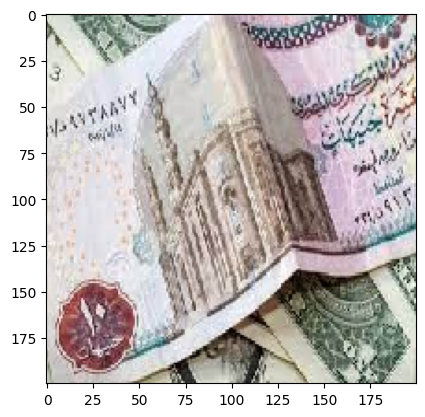

Testing images in directory:  100
1/1 [==============================] - 0s 29ms/step
Image:  100.16.jpg
Predicted class:  100
Actual class:  100


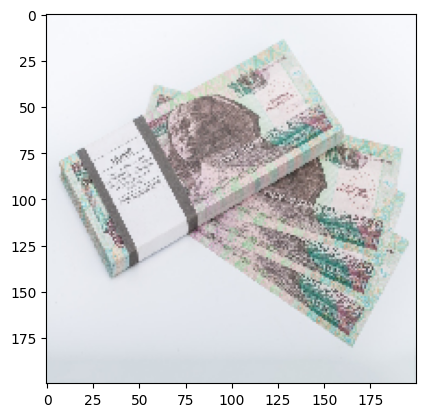

1/1 [==============================] - 0s 34ms/step
Image:  100.20.jpg
Predicted class:  100
Actual class:  100


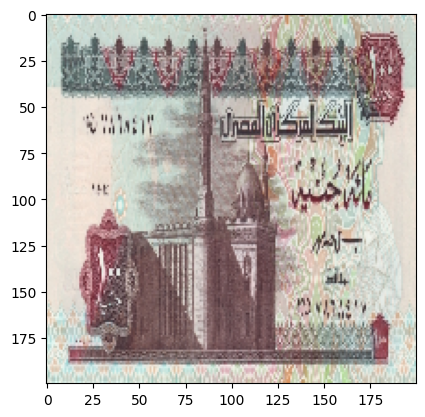

1/1 [==============================] - 0s 29ms/step
Image:  100.32.jpg
Predicted class:  100
Actual class:  100


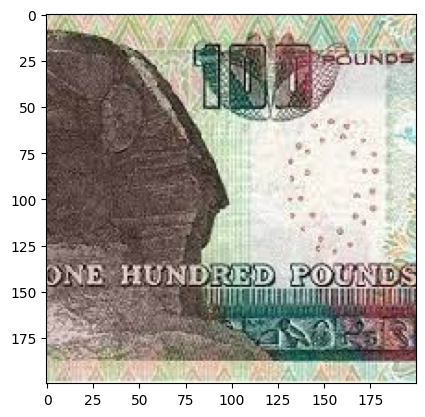

1/1 [==============================] - 0s 52ms/step
Image:  100.54.jpg
Predicted class:  100
Actual class:  100


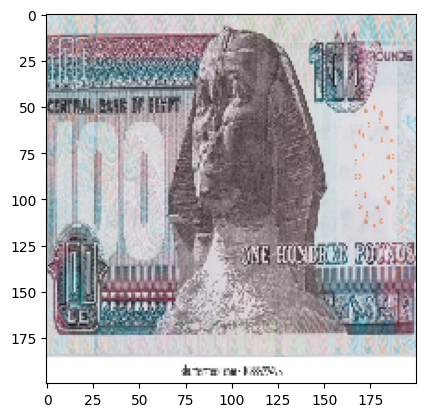

1/1 [==============================] - 0s 42ms/step
Image:  100.44.jpg
Predicted class:  20
Actual class:  100


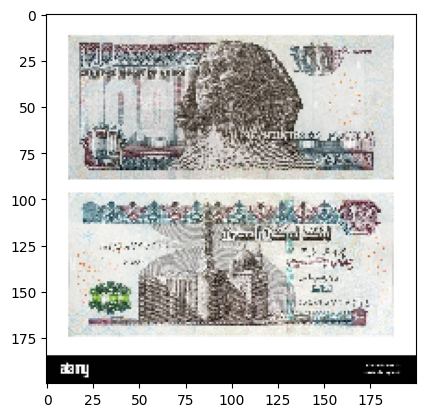

1/1 [==============================] - 0s 31ms/step
Image:  100.55.jpg
Predicted class:  100
Actual class:  100


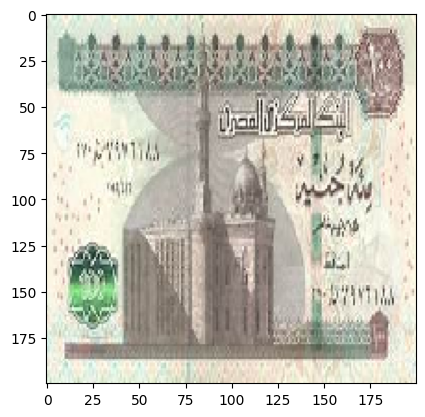

1/1 [==============================] - 0s 29ms/step
Image:  100.58.jpg
Predicted class:  20
Actual class:  100


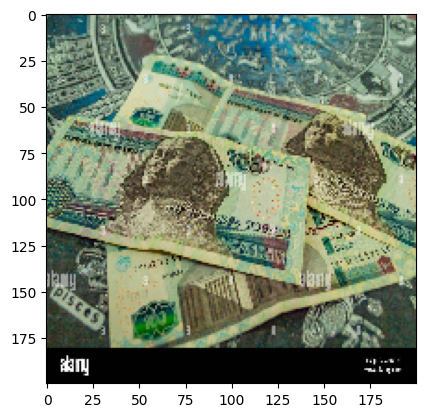

1/1 [==============================] - 0s 30ms/step
Image:  100.9.jpg
Predicted class:  20
Actual class:  100


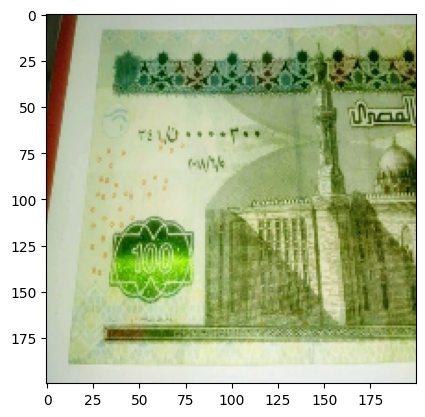

1/1 [==============================] - 0s 28ms/step
Image:  100.86.jpg
Predicted class:  100
Actual class:  100


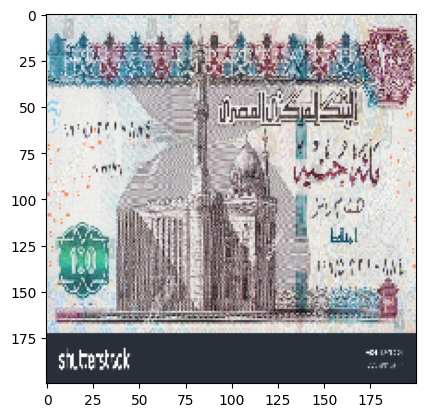

Testing images in directory:  50
1/1 [==============================] - 0s 27ms/step
Image:  50.33.jpg
Predicted class:  50
Actual class:  50


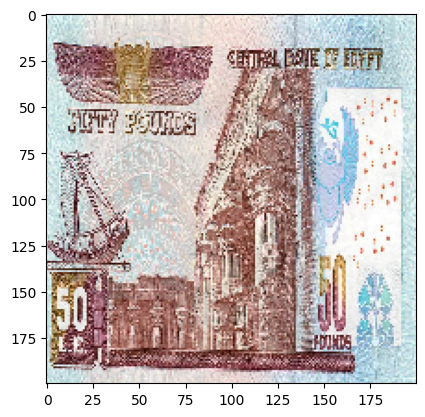

1/1 [==============================] - 0s 33ms/step
Image:  50.45.jpg
Predicted class:  50
Actual class:  50


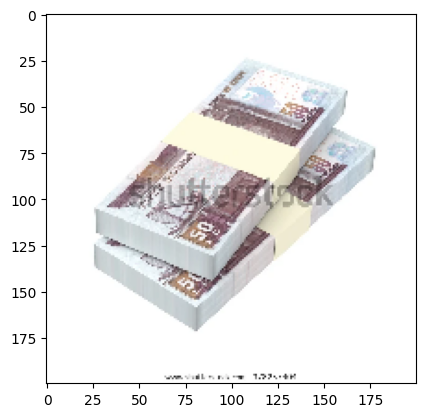

1/1 [==============================] - 0s 27ms/step
Image:  50.20.jpg
Predicted class:  100
Actual class:  50


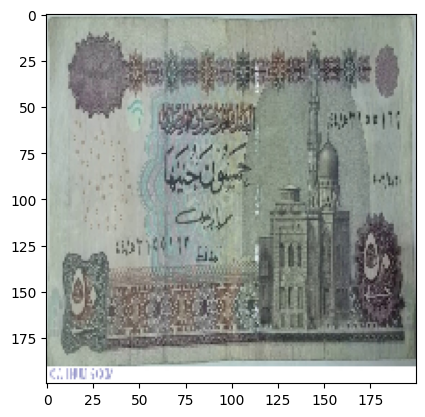

1/1 [==============================] - 0s 29ms/step
Image:  50.88.jpg
Predicted class:  20
Actual class:  50


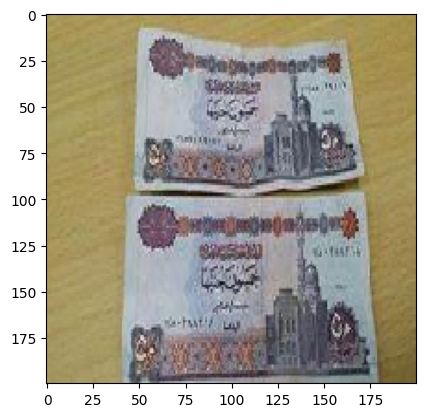

1/1 [==============================] - 0s 33ms/step
Image:  50.84.jpg
Predicted class:  100
Actual class:  50


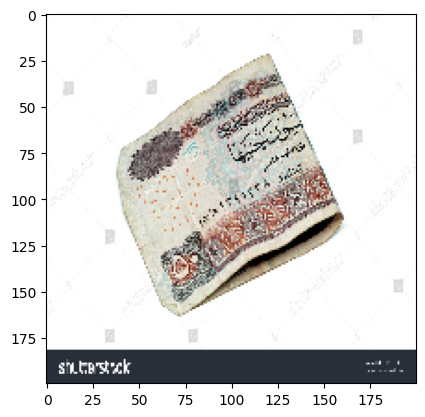

1/1 [==============================] - 0s 27ms/step
Image:  50.96.jpg
Predicted class:  20
Actual class:  50


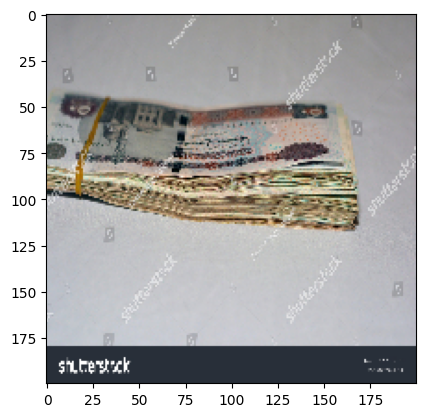

1/1 [==============================] - 0s 26ms/step
Image:  50.8.jpg
Predicted class:  50
Actual class:  50


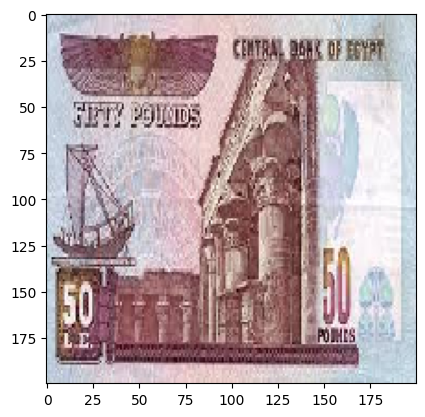

1/1 [==============================] - 0s 28ms/step
Image:  50.55.jpg
Predicted class:  50
Actual class:  50


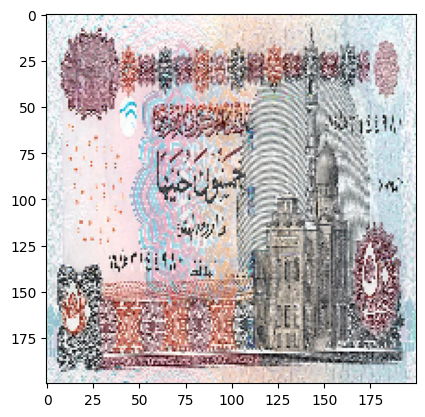

1/1 [==============================] - 0s 26ms/step
Image:  50.56.jpg
Predicted class:  50
Actual class:  50


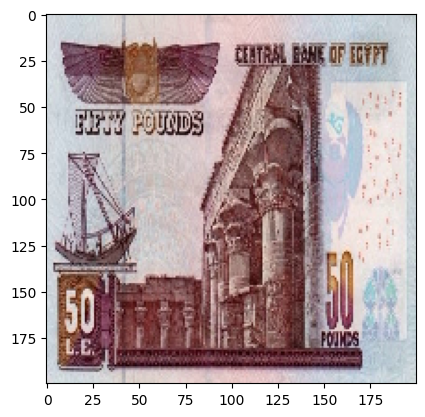

1/1 [==============================] - 0s 28ms/step
Image:  50.59.jpg
Predicted class:  50
Actual class:  50


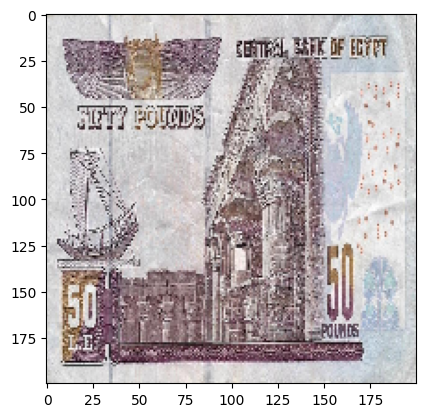

Testing images in directory:  5
1/1 [==============================] - 0s 27ms/step
Image:  5.58.jpg
Predicted class:  5
Actual class:  5


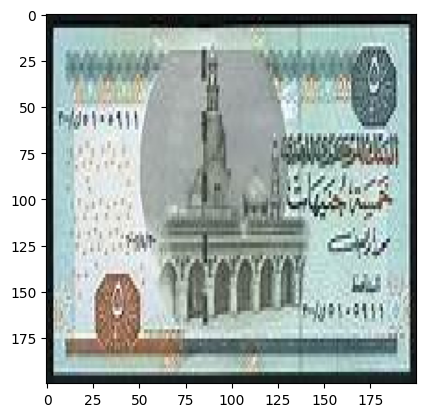

1/1 [==============================] - 0s 41ms/step
Image:  5.20.jpg
Predicted class:  5
Actual class:  5


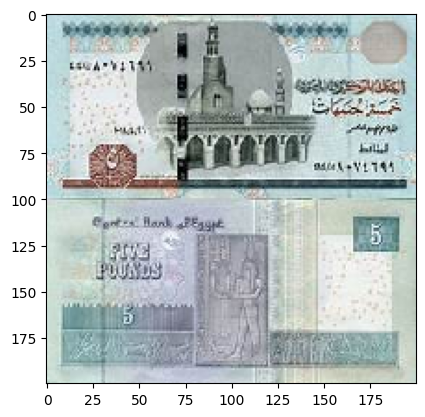

1/1 [==============================] - 0s 28ms/step
Image:  5.55.jpg
Predicted class:  5
Actual class:  5


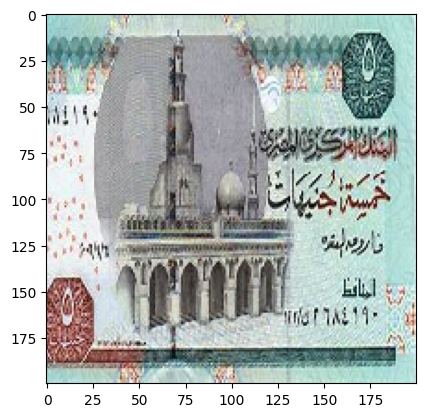

1/1 [==============================] - 0s 31ms/step
Image:  5.44.jpg
Predicted class:  5
Actual class:  5


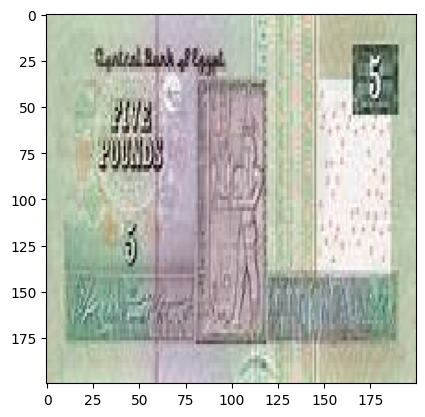

1/1 [==============================] - 0s 27ms/step
Image:  5.96.jpg
Predicted class:  5
Actual class:  5


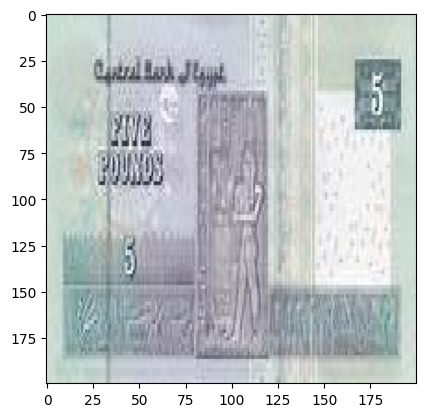

1/1 [==============================] - 0s 34ms/step
Image:  5.82.jpg
Predicted class:  5
Actual class:  5


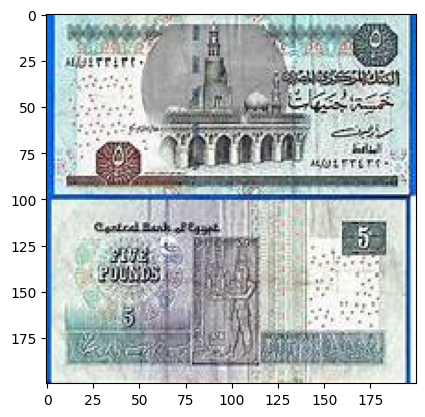

1/1 [==============================] - 0s 26ms/step
Image:  5.89.jpg
Predicted class:  5
Actual class:  5


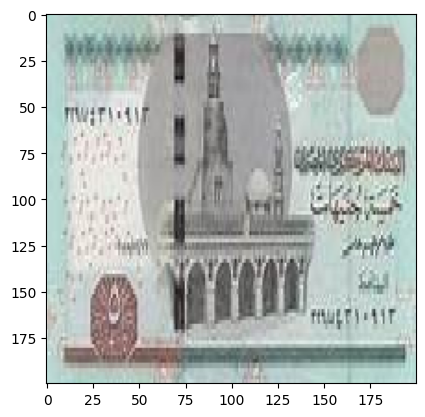

1/1 [==============================] - 0s 27ms/step
Image:  5.85.jpg
Predicted class:  5
Actual class:  5


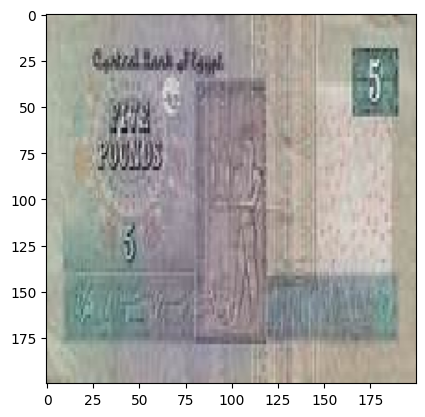

1/1 [==============================] - 0s 28ms/step
Image:  5.54.jpg
Predicted class:  5
Actual class:  5


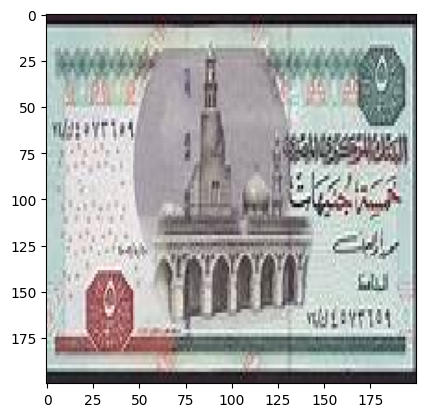

1/1 [==============================] - 0s 27ms/step
Image:  5.32.jpg
Predicted class:  5
Actual class:  5


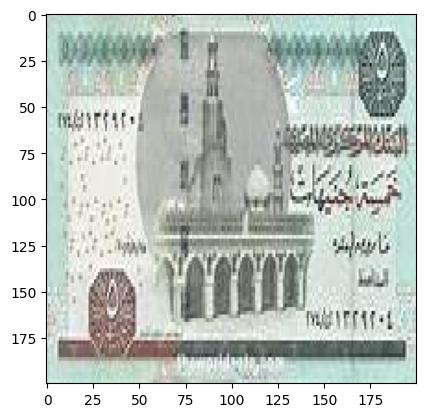

Testing images in directory:  1
1/1 [==============================] - 0s 27ms/step
Image:  1.89.jpg
Predicted class:  1
Actual class:  1


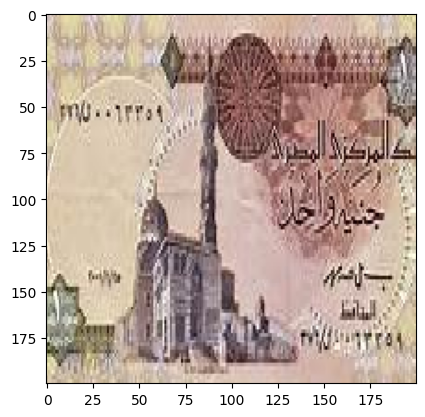

1/1 [==============================] - 0s 26ms/step
Image:  1.85.jpg
Predicted class:  1
Actual class:  1


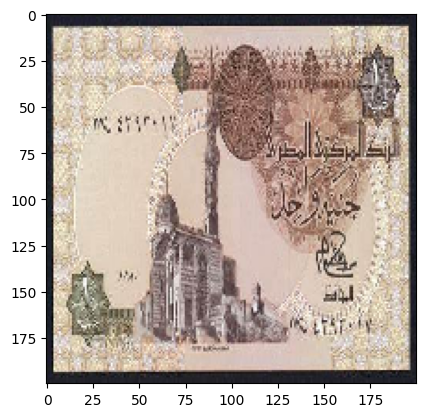

1/1 [==============================] - 0s 26ms/step
Image:  1.82.jpg
Predicted class:  1
Actual class:  1


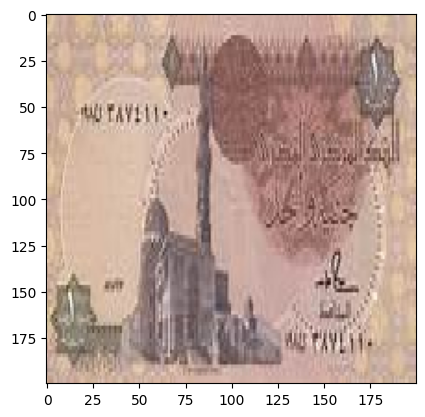

1/1 [==============================] - 0s 26ms/step
Image:  1.31.jpg
Predicted class:  1
Actual class:  1


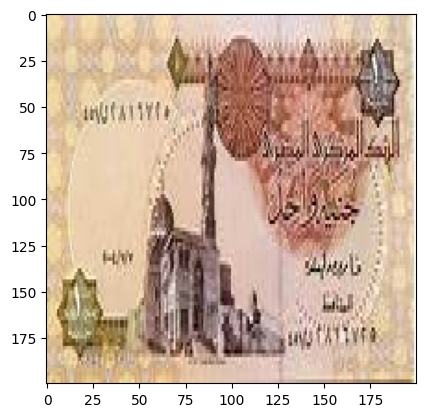

1/1 [==============================] - 0s 26ms/step
Image:  1.54.jpg
Predicted class:  1
Actual class:  1


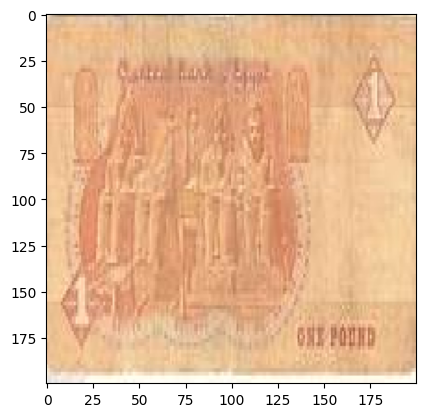

1/1 [==============================] - 0s 46ms/step
Image:  1.2.jpg
Predicted class:  1
Actual class:  1


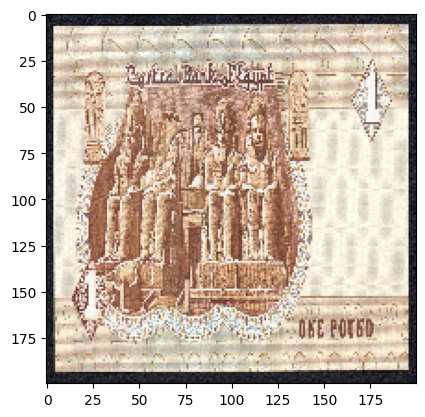

1/1 [==============================] - 0s 50ms/step
Image:  1.44.jpg
Predicted class:  1
Actual class:  1


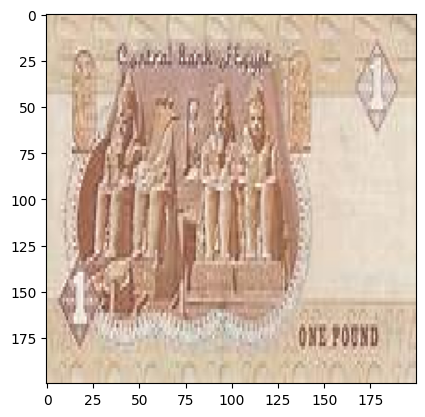

1/1 [==============================] - 0s 55ms/step
Image:  1.55.jpg
Predicted class:  1
Actual class:  1


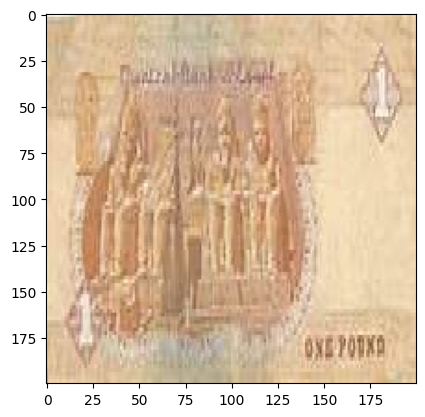

1/1 [==============================] - 0s 62ms/step
Image:  1.96.jpg
Predicted class:  1
Actual class:  1


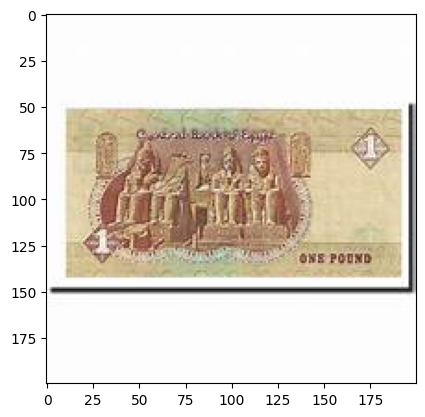

1/1 [==============================] - 0s 56ms/step
Image:  1.58.jpg
Predicted class:  20
Actual class:  1


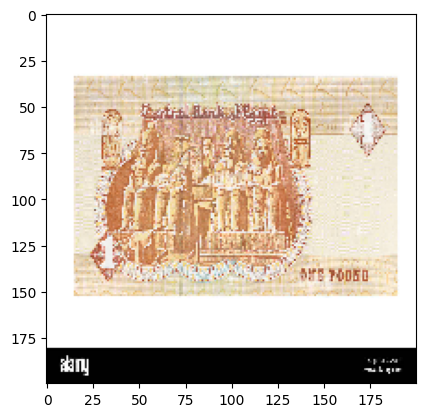

Testing images in directory:  200
1/1 [==============================] - 0s 56ms/step
Image:  200.42.jpg
Predicted class:  200
Actual class:  200


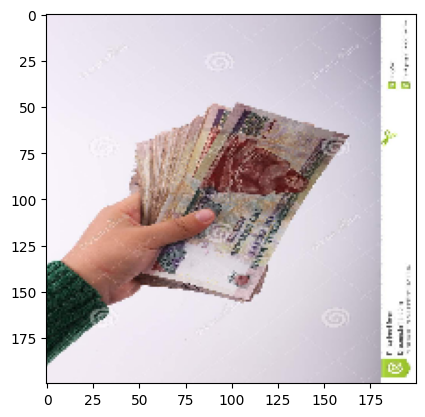

1/1 [==============================] - 0s 41ms/step
Image:  200.31.jpg
Predicted class:  200
Actual class:  200


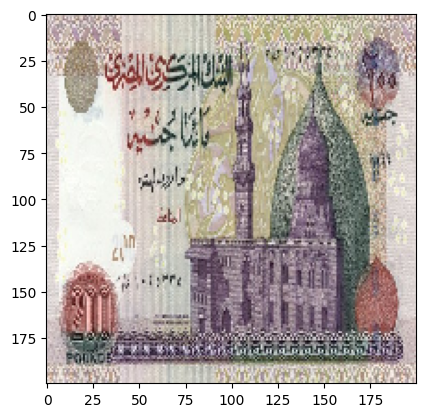

1/1 [==============================] - 0s 36ms/step
Image:  200.19.jpg
Predicted class:  200
Actual class:  200


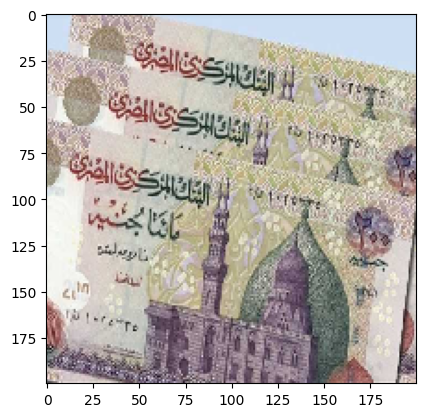

1/1 [==============================] - 0s 55ms/step
Image:  200.52.jpg
Predicted class:  20
Actual class:  200


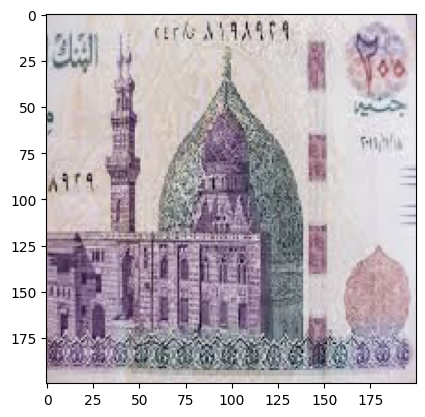

1/1 [==============================] - 0s 34ms/step
Image:  200.56.jpg
Predicted class:  200
Actual class:  200


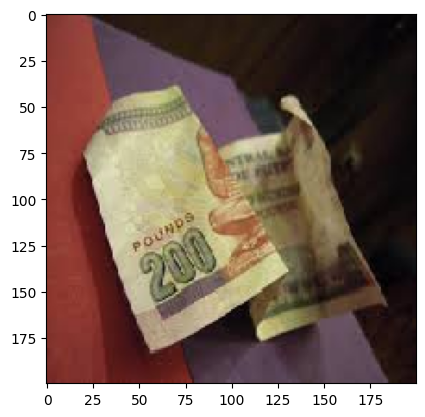

1/1 [==============================] - 0s 64ms/step
Image:  200.96.jpg
Predicted class:  200
Actual class:  200


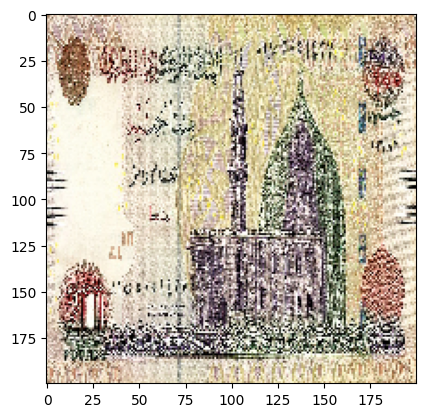

1/1 [==============================] - 0s 39ms/step
Image:  200.83.jpg
Predicted class:  200
Actual class:  200


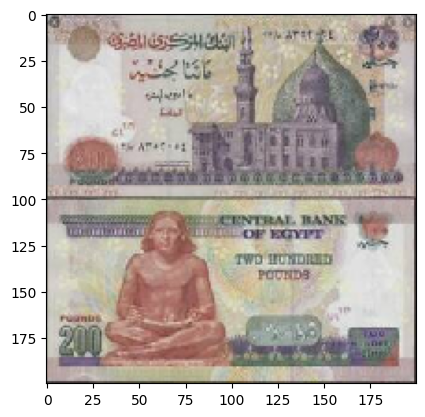

1/1 [==============================] - 0s 32ms/step
Image:  200.53.jpg
Predicted class:  200
Actual class:  200


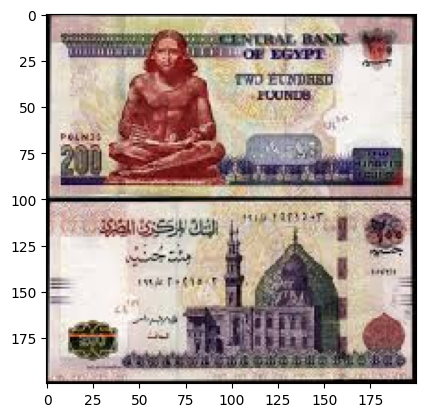

1/1 [==============================] - 0s 32ms/step
Image:  200.80.jpg
Predicted class:  200
Actual class:  200


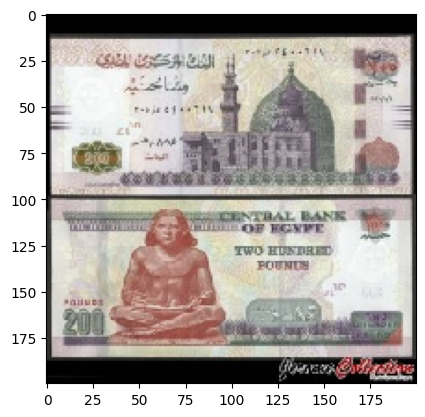

1/1 [==============================] - 0s 26ms/step
Image:  200.87.jpg
Predicted class:  200
Actual class:  200


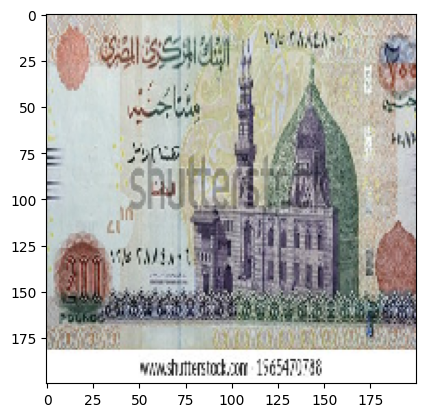

In [ ]:
import os
import numpy as np
from keras.models import load_model
import keras.utils as image
import matplotlib.pyplot as plt

# Your label mapping
label_mapping = {0: 1, 1: 10, 2: 100, 3: 20, 4: 200, 5: 5, 6: 50}


# Define the directory of the test images
test_dir = '/content/drive/MyDrive/Output of Egyptain Currency/val'


# Function to load and preprocess the image
def load_image(img_path):
    img = image.load_img(img_path, target_size=(150, 150))
    img_tensor = image.img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)
    img_tensor /= 255.
    return img_tensor

# Initialize the prediction and actual labels
predicted_labels = []
actual_labels = []

# Iterate over each subdirectory
for sub_dir in os.listdir(test_dir):
    print("Testing images in directory: ", sub_dir)
    sub_dir_path = os.path.join(test_dir, sub_dir)

    # Check if it is a directory
    if os.path.isdir(sub_dir_path):

        # Iterate over each image
        for filename in os.listdir(sub_dir_path):
            img_path = os.path.join(sub_dir_path, filename)

            # Load and preprocess the image
            new_image = load_image(img_path)

            # Make a prediction
            pred = loaded_model.predict(new_image)

            # Take the class with highest probability
            predicted_class_index = np.argmax(pred[0])
            predicted_class = label_mapping[predicted_class_index]

            # Append the predicted and actual labels
            predicted_labels.append(predicted_class)
            actual_labels.append([int(sub_dir)])

            # Print and display the image with predicted and actual class
            print("Image: ", filename)
            print("Predicted class: ", predicted_class)
            print("Actual class: ", sub_dir)
            img = image.load_img(img_path, target_size=(200, 200))
            plt.imshow(img)
            plt.show()

In [ ]:
from sklearn.metrics import confusion_matrix
import seaborn as sns

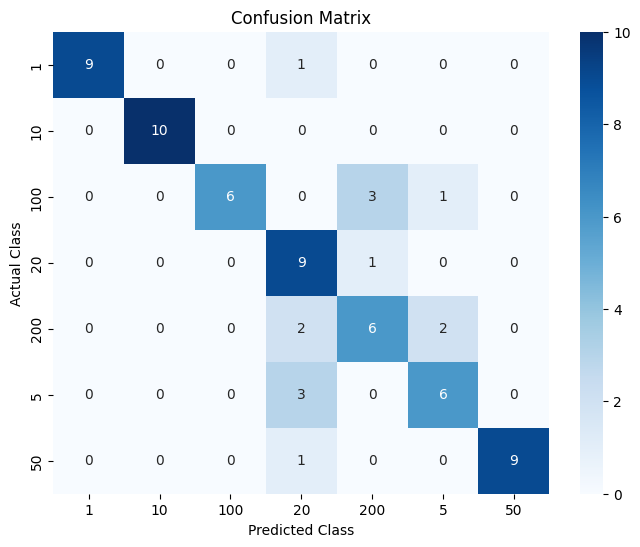

In [ ]:
# Generate the confusion matrix
cm = confusion_matrix(actual_labels, predicted_labels)

# Plot the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues', xticklabels=label_mapping.values(), yticklabels=label_mapping.values())
plt.xlabel('Predicted Class')
plt.ylabel('Actual Class')
plt.title('Confusion Matrix')
plt.show()